# $\mathrm{O_3}$

In [12]:
using Pkg 
Pkg.activate("../")

  Activating project at `~/gitrepos/activepure/Photolysis.jl/mcm`


In [13]:
Pkg.add("DelimitedFiles")

   Resolving package versions...
  No Changes to `~/gitrepos/activepure/Photolysis.jl/mcm/Project.toml`
  No Changes to `~/gitrepos/activepure/Photolysis.jl/mcm/Manifest.toml`


In [14]:
using Plots, MLPlotRecipes
using HDF5
using Tables, DataFrames, CSV, DelimitedFiles
using MLJ, MLJGaussianProcesses
using StatsBase 
using KernelFunctions
using ParameterHandling

In [15]:
include("./utils.jl")

filter_outliers (generic function with 1 method)

# Loading Data

In [16]:
h5_path = "../../data/photolysis_data.h5" 
species = "O3" 
nice_name = "O₃"
λs, σs, T1s, T2s, source_idx, T_units, category, formula, λ_units, σ_units = get_raw_data(h5_path, species)

([116.65, 117.3, 117.95, 118.65, 119.4, 120.15, 120.85, 121.6, 122.35, 123.1  …  249.0, 249.5, 250.0, 250.5, 251.0, 251.5, 252.0, 252.5, 253.0, 253.5], [7.8e-18, 7.97e-18, 8.66e-18, 9.51e-18, 1.25e-17, 1.84e-17, 2.19e-17, 2.3e-17, 2.26e-17, 2.06e-17  …  1.053e-17, 1.052e-17, 1.09e-17, 1.08e-17, 1.086e-17, 1.108e-17, 1.125e-17, 1.11e-17, 1.104e-17, 1.143e-17], [298.0, 298.0, 230.0, 299.0, 294.0, 298.0, 298.0, 298.0, 300.0, 500.0  …  195.0, 195.0, 228.0, 228.0, 228.0, 228.0, 295.0, 295.0, 295.0, 295.0], [NaN, NaN, NaN, NaN, NaN, NaN, NaN, NaN, NaN, NaN  …  NaN, NaN, NaN, NaN, NaN, NaN, NaN, NaN, NaN, NaN], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  249, 249, 249, 249, 249, 249, 249, 249, 249, 249], "K", "Ozone", "O3", "nm", "cm^2")

In [17]:
# load in spectrometer wavelengths
hr4000_df = CSV.File("../hr4000_wavelengths.txt") |> DataFrame ; 
oceanoptics_df = readdlm("../oceanoptics_λs.csv")

println(nrow(hr4000_df))
println(size(oceanoptics_df))

3648
(3648, 1)


In [18]:
# verify that the two wavelength sets are the same

all((hr4000_df.λ .- oceanoptics_df) .≈ 0.0)

true

In [19]:
println(nrow(hr4000_df))
println(maximum(hr4000_df.λ))
println(minimum(hr4000_df.λ))

3648
1120.216
194.249


In [20]:
Δλ = 50 # nm for padding
df = data_to_df(λs, σs, T1s, T2s, source_idx; λ_lb=minimum(hr4000_df.λ)-Δλ, λ_ub=maximum(hr4000_df.λ)+Δλ)
println(nrow(df))
describe(df)

366284


Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,λ,565.311,144.91,539.96,1100.0,0,Float64
2,σ,9.07613e-19,3.4377e-25,8.0905e-22,1.41e-17,0,Float64
3,T,293.791,290.0,293.0,300.0,0,Float64
4,source_id,130.284,1,175.0,249,0,Int64


In [21]:
nskip = 5

p2 = scatter(
    df.λ[1:nskip:end],
    log10.(df.σ[1:nskip:end]),
    zcolor=df.T[1:nskip:end],
    ms=3, 
    msw=0,
    xlabel="λ [$(λ_units)]",
    ylabel="log10(σ) [cm²]",
    alpha=0.7,
    rightmargin=10Plots.mm,
    colorbar_title="T [$(T_units)]",
    title="Absorption Cross Section for $(nice_name)",
    label="",
)


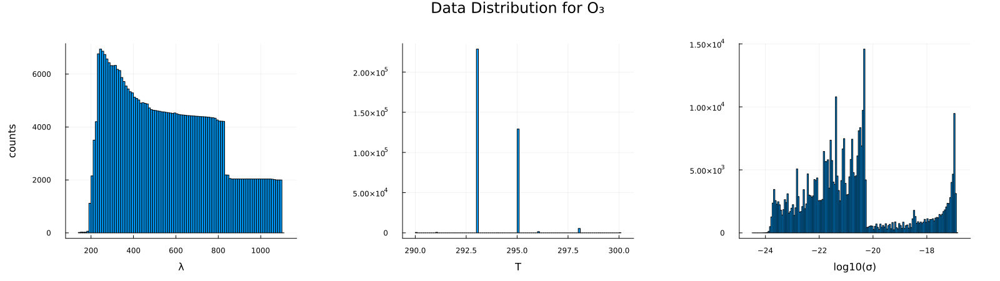

In [22]:
p1 = histogram(df.λ, xlabel="λ", ylabel="counts", label="", margin=10Plots.mm)
p2 = histogram(df.T, xlabel="T", label="", margin=10Plots.mm)
p3 = histogram(log10.(df.σ), xlabel="log10(σ)", label="", margin=10Plots.mm)
#p3 = histogram(df.σ, xlabel="σ", ylabel="counts")

phist = plot(p1, p2, p3, layout=(1,3), size=(1600, 450), plot_title="Data Distribution for $(nice_name)")

In [23]:
# load in spectrometer wavelengths
hr4000_df = CSV.File("../hr4000_wavelengths.txt") |> DataFrame ; 

In [24]:
println(nrow(hr4000_df))
println(maximum(hr4000_df.λ))
println(minimum(hr4000_df.λ))

3648
1120.216
194.249


# Data Preprocessing

In [25]:
gdfs = groupby(df, :T)

res_dfs = []

for gdf ∈ gdfs
    gdf_by_λ = groupby(gdf, :λ)
    push!(res_dfs, combine(gdf_by_λ, [:σ, :T] .=> mean, renamecols = false))
end

df_unique = vcat(res_dfs...)

Row,λ,σ,T
,Float64,Float64,Float64
1,145.95,5.23e-18,298.0
2,148.1,4.47e-18,298.0
3,150.35,3.69e-18,298.0
4,152.65,2.93e-18,298.0
5,155.0,2.19e-18,298.0
6,157.45,1.63e-18,298.0
7,160.0,1.2e-18,298.0
8,162.6,9.77e-19,298.0
9,165.3,8.66e-19,298.0


In [26]:
function representative_rand_sample(column::AbstractVector, nbins::Int, npoints::Int)
    n_per_bin = floor(Int, npoints/nbins)
    hist = fit(Histogram, column, nbins=nbins)
    bin_edges = hist.edges[1]
    
    idx_out = []
    
    # loop over each bin
    for i ∈ 1:size(bin_edges, 1)-1
        bin_idxs = findall(ξ -> bin_edges[i] < ξ && ξ < bin_edges[i+1], column)
        n_to_sample = minimum([n_per_bin, size(bin_idxs, 1)])
        idx_res = sample(bin_idxs, n_to_sample, replace=false)
        push!(idx_out, idx_res)  # sample without replacement
    end

    return unique(vcat(idx_out...))
end

λ_idxs = representative_rand_sample(df_unique.λ, 1000, 1500)
σ_idxs = representative_rand_sample(log10.(df_unique.σ), 500, 2000) 



idxs_res = shuffle(unique(vcat(λ_idxs, σ_idxs)))


df_sampled = df_unique[idxs_res, :]


max_data_λ = maximum(df_sampled.λ)
min_data_λ = minimum(df_sampled.λ)

144.91

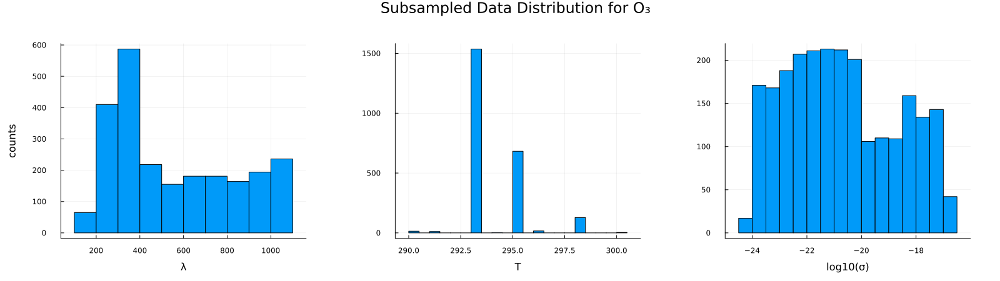

In [27]:
p1 = histogram(df_sampled.λ, xlabel="λ", ylabel="counts", label="", margin=10Plots.mm)
p2 = histogram(df_sampled.T, xlabel="T", label="", margin=10Plots.mm)
p3 = histogram(log10.(df_sampled.σ), xlabel="log10(σ)", label="", margin=10Plots.mm)
#p3 = histogram(df.σ, xlabel="σ", ylabel="counts")

phist = plot(p1, p2, p3, layout=(1,3), size=(1600, 450), plot_title="Subsampled Data Distribution for $(nice_name)")

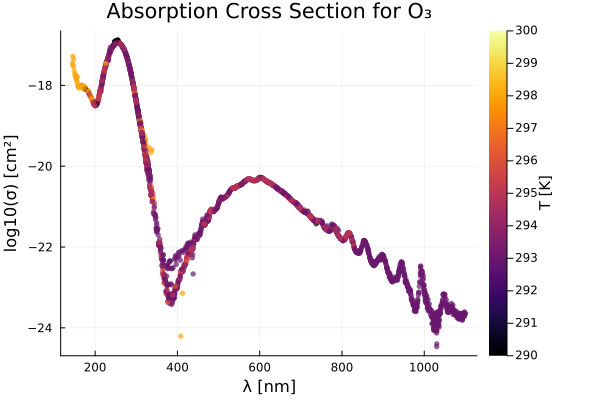

In [28]:
p = scatter(
    df_sampled.λ,
    log10.(df_sampled.σ),
    zcolor=df_sampled.T,
    ms=3, 
    msw=0,
    xlabel="λ [$(λ_units)]",
    ylabel="log10(σ) [cm²]",
    alpha=0.7,
    rightmargin=10Plots.mm,
    colorbar_title="T [$(T_units)]",
    title="Absorption Cross Section for $(nice_name)",
    label="",
)

# GPR Fit

In [29]:
train_frac = 0.85
ntrain = trunc(Int, train_frac * nrow(df_sampled))
println(ntrain)

2032


In [30]:
idxs = shuffle(1:nrow(df_sampled))
idxs_train = idxs[1:ntrain]
idxs_test = idxs[ntrain+1:end]

Xtrain = df_sampled[idxs_train, [:λ, :T]]
Xtest = df_sampled[idxs_test, [:λ, :T]]

ytrain = log10.(df_sampled.σ[idxs_train])
ytest = log10.(df_sampled.σ[idxs_test])

359-element Vector{Float64}:
 -18.311421796188572
 -20.425155452663162
 -21.59316391889896
 -20.385583725614154
 -19.98520842679256
 -20.71704046019052
 -20.497003821915726
 -20.409205240478386
 -18.86396787531305
 -20.930779745775368
 -22.43529725302212
 -18.253365801062422
 -21.684288315105565
   ⋮
 -22.867224491870854
 -17.67391003573644
 -17.656286227075583
 -18.018181392829337
 -22.503091375608015
 -20.543080063304586
 -19.941651616417616
 -21.62807354593875
 -23.04791309571768
 -23.447891678947986
 -17.252090476057454
 -17.52326688841393

In [31]:
# compute length scales
κ = 1
ℓ_λ = std(Xtrain.λ)/κ
ℓ_T = std(Xtrain.T)/κ

# compute variance parameters
SNR = 5 
σf² = var(ytrain)
σₙ² = (sqrt(σf²)/SNR)^2

# set up initial values list
θ_init = (σf²=positive(σf²), ℓ_λ=positive(ℓ_λ), ℓ_T=positive(ℓ_T))


function mykernel(θ::NamedTuple)
    return θ.σf² * with_lengthscale(SqExponentialKernel(), [θ.ℓ_λ, θ.ℓ_T])
end

mykernel (generic function with 1 method)

In [32]:
μ_init = -30.0
gpr = GPR(
    μ=μ_init,
    k=mykernel,
    θ_init=θ_init,
    σ²=σₙ²,
)

GPR(
  μ = -30.0, 
  k = mykernel, 
  θ_init = (σf² = ParameterHandling.Positive{Float64, typeof(exp), Float64}(1.3890704135383745, exp, 1.4901161193847656e-8), ℓ_λ = ParameterHandling.Positive{Float64, typeof(exp), Float64}(5.638022813793982, exp, 1.4901161193847656e-8), ℓ_T = ParameterHandling.Positive{Float64, typeof(exp), Float64}(0.3345838065086642, exp, 1.4901161193847656e-8)), 
  σ² = 0.16044478607125723, 
  optimizer = Optim.LBFGS{Nothing, LineSearches.InitialStatic{Float64}, LineSearches.HagerZhang{Float64, Base.RefValue{Bool}}, Optim.var"#19#21"}(10, LineSearches.InitialStatic{Float64}
  alpha: Float64 1.0
  scaled: Bool false
, LineSearches.HagerZhang{Float64, Base.RefValue{Bool}}
  delta: Float64 0.1
  sigma: Float64 0.9
  alphamax: Float64 Inf
  rho: Float64 5.0
  epsilon: Float64 1.0e-6
  gamma: Float64 0.66
  linesearchmax: Int64 50
  psi3: Float64 0.1
  display: Int64 0
  mayterminate: Base.RefValue{Bool}
, nothing, Optim.var"#19#21"(), Optim.Flat(), true))

In [33]:
mach = machine(gpr, Xtrain, ytrain) |> fit!

[ Info: Training machine(GPR(μ = -30.0, …), …).


Iter     Function value   Gradient norm 
     0     3.106685e+03     4.311205e+03
 * time: 0.01669001579284668
     1     1.659067e+03     9.220315e+02
 * time: 13.221776962280273
     2    -5.144471e+02     5.915960e+02
 * time: 15.930978059768677
     3    -6.218658e+02     5.153357e+02
 * time: 17.243393898010254
     4    -1.273523e+03     4.909616e+02
 * time: 18.56487488746643
     5    -1.345222e+03     8.200976e+01
 * time: 21.730592012405396
     6    -1.369728e+03     9.554168e+01
 * time: 23.656533002853394
     7    -1.396185e+03     1.857663e+02
 * time: 25.731258869171143
     8    -1.442985e+03     5.585363e+01
 * time: 27.677114009857178
     9    -1.447493e+03     1.044042e+01
 * time: 29.7620849609375
    10    -1.447861e+03     8.414186e+00
 * time: 31.697225093841553
    11    -1.449545e+03     1.746897e+01
 * time: 34.43737506866455
    12    -1.449749e+03     7.193774e-01
 * time: 36.41118288040161
    13    -1.449749e+03     1.195281e-01
 * time: 38.4643740653991

trained Machine; caches model-specific representations of data
  model: GPR(μ = -30.0, …)
  args: 
    1:	Source @540 ⏎ Table{AbstractVector{Continuous}}
    2:	Source @073 ⏎ AbstractVector{Continuous}


# Model Evaluation

In [34]:
rpt = report(mach)

(summary = "L-BFGS",
 minimizer = [3.4716074734816793, 3.271285114310913, 3.248101756092812, -4.597161310879394],
 minimum = -1449.7493819723904,
 iterations = 1000,
 converged = false,)

In [35]:
y_pred_train = predict_mean(mach, Xtrain);
y_pred_test = predict_mean(mach, Xtest);

now let's collect some more points in order to evaluate our model using indices other than the ones used during training. 


┌ Warning: Keyword argument `orientation` is deprecated.
│ Please use `permute` instead.
└ @ Plots ~/.julia/packages/Plots/io9zQ/src/args.jl:1548


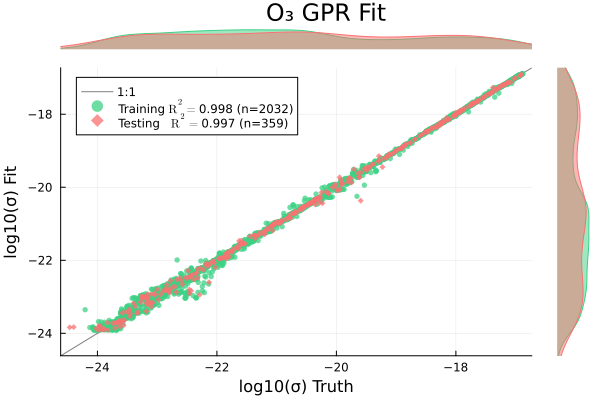

In [36]:
p = scatterresult(
    ytrain, y_pred_train,
    ytest, y_pred_test,
    xlabel="log10(σ) Truth",
    ylabel="log10(σ) Fit",
    plot_title="$(nice_name) GPR Fit"
)


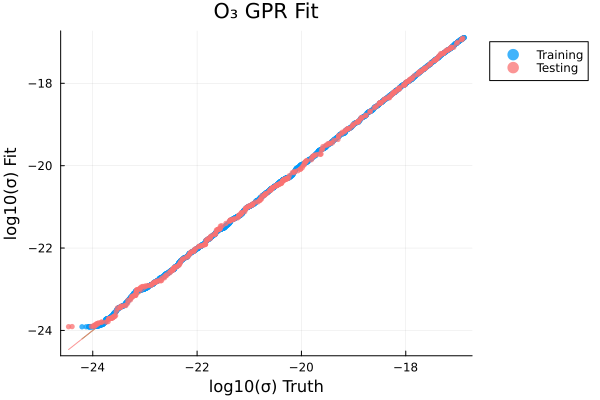

In [37]:
p = quantilequantile(
    ytrain, y_pred_train,
    ytest, y_pred_test,
    xlabel="log10(σ) Truth",
    ylabel="log10(σ) Fit",
    title="$(nice_name) GPR Fit"
)


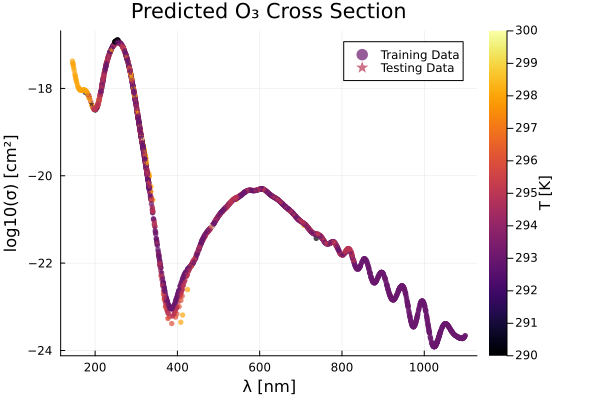

In [38]:
p1 = scatter(
    Xtrain.λ,
    y_pred_train,
    zcolor=Xtrain.T,
    ms=3, 
    msw=0,
    xlabel="λ [$(λ_units)]",
    ylabel="log10(σ) [cm²]",
    alpha=0.7,
    rightmargin=10Plots.mm,
    colorbar_title="T [$(T_units)]",
    label="Training Data",
)

scatter!(
    Xtest.λ,
    y_pred_test,
    zcolor=Xtest.T,
    ms=3, 
    msw=0,
    # markershape=:rect,
    markershape=:star5,
    xlabel="λ [$(λ_units)]",
    ylabel="log10(σ) [cm²]",
    alpha=0.7,
    rightmargin=10Plots.mm,
    colorbar_title="T [$(T_units)]",
    title="Predicted $(nice_name) Cross Section",
    label="Testing Data",
)


Finally, let's try prediction at the desired wavelength bins: 

194.249
1099.55


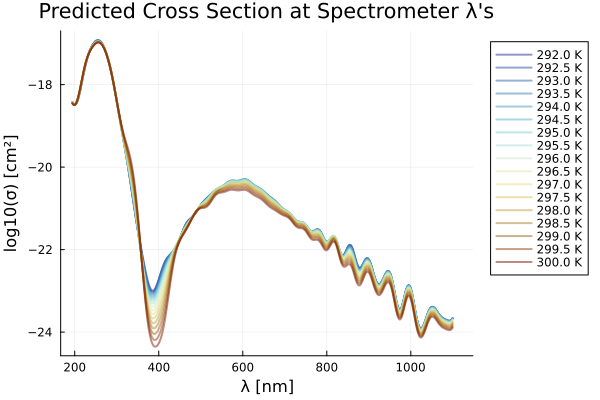

In [39]:
λ_min = maximum([min_data_λ, minimum(hr4000_df.λ)])
λ_max = minimum([max_data_λ, maximum(hr4000_df.λ)])

println(λ_min)
println(λ_max)

function predict_logσ(T, λs, mach, λ_bounds)
    λ_lb, λ_ub = λ_bounds
    
    Xout = copy(λs)
    Tout = T
    Xout[!, :T] = [Tout for _ ∈ 1:nrow(λs)]
    res = predict_mean(mach, Xout)
    
    idxs = [idx for idx ∈ 1:nrow(Xout) if (Xout.λ[idx] ≤ λ_lb) || (λ_ub ≤ Xout.λ[idx])]
    res[idxs] .= NaN 
    return res
end



p = plot()

Ts = 292.0:0.5:300.0
# cs = cgrad(:thermal, Ts, categorical = true)
cs = cgrad(:roma, size(Ts,1), categorical = true, rev=true)
i = 1
for T ∈ Ts
    logσ = predict_logσ(T, hr4000_df, mach, (λ_min, λ_max))
    plot!(
        hr4000_df.λ, logσ,
        linewidth=2,
        alpha=0.5,
        color=cs[i],
        label="$(T) K",
        legend=:outertopright,
    )
    i+=1
end

xlabel!("λ [nm]")
ylabel!("log10(σ) [cm²]")
title!("Predicted Cross Section at Spectrometer λ's")

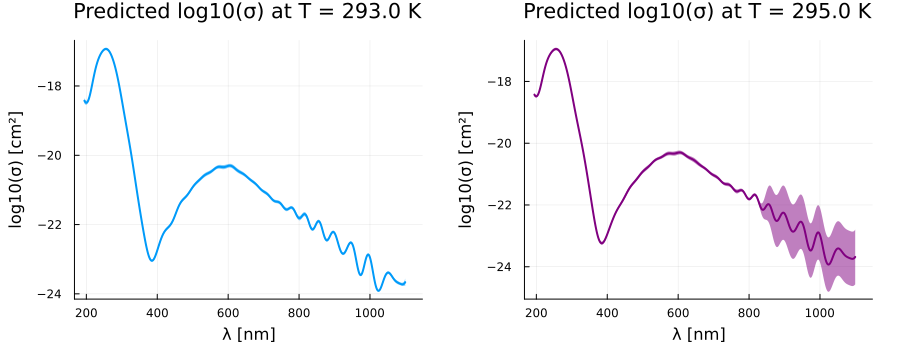

In [40]:
function predict_logσ_wΔ(T, λs, mach, λ_bounds)
    λ_lb, λ_ub = λ_bounds
    
    Xout = copy(λs)
    Tout = T
    Xout[!, :T] = [Tout for _ ∈ 1:nrow(λs)]
    res = MLJ.predict(mach, Xout)

    logσ = mean.(res)
    Δlogσ = std.(res)

    idxs = [idx for idx ∈ 1:nrow(Xout) if (Xout.λ[idx] ≤ λ_lb) || (λ_ub ≤ Xout.λ[idx])]
    logσ[idxs] .= NaN 
    Δlogσ[idxs] .= NaN 
    return logσ, Δlogσ
    #return res
end

Tplot = 293.0
logσ, Δlogσ = predict_logσ_wΔ(Tplot, hr4000_df, mach, (λ_min, λ_max))

p1 = plot(
    hr4000_df.λ, logσ,
    ribbon= 2 .* Δlogσ,
    fillalpha=0.5,
    linewidth=2,
    xlabel="λ [nm]",
    ylabel="log10(σ) [cm²]",
    title="Predicted log10(σ) at T = $(Tplot) K",
    label="",
)

Tplot = 295.0
logσ, Δlogσ = predict_logσ_wΔ(Tplot, hr4000_df, mach, (λ_min, λ_max))

p2 = plot(
    hr4000_df.λ, logσ,
    ribbon= 2 .* Δlogσ,
    fillalpha=0.5,
    linewidth=2,
    color=:purple,
    xlabel="λ [nm]",
    ylabel="log10(σ) [cm²]",
    title="Predicted log10(σ) at T = $(Tplot) K",
    label=""
)

plot(p1, p2, layout=(1,2), margin=5Plots.mm, size=(900,350)) 

# Output for Photolysis Rate Determination

In [66]:
df_photolysis_σ = DataFrame() 

df_photolysis_σ.λ = hr4000_df.λ;

In [67]:
using DataInterpolations

now we need to define a `λ_min` and `λ_max`. We will set all values outside of this range to 0

In [68]:
λ_min = minimum(df_sampled.λ)
λ_max = maximum(df_sampled.λ)

println(λ_min, "\t", minimum(df_photolysis_σ.λ))
println(λ_max, "\t", maximum(df_photolysis_σ.λ))

144.91	194.249
1099.55	1120.216


In [80]:
Tplot = 293.0
logσ, Δlogσ = predict_logσ_wΔ(Tplot, hr4000_df, mach, (λ_min, λ_max))

σ = 10 .^ logσ

replace!(σ, NaN => 0.0)

# set anything outside of λ range to 0 as well
σ[hr4000_df.λ .< λ_min .|| hr4000_df.λ .> λ_max] .= 0.0


df_photolysis_σ.σ_1 = σ
df_photolysis_σ.σ_2 = σ


CSV.write("../photolysis_σ.csv", df_photolysis_σ)

"../photolysis_σ.csv"